#**Step 01: Clone the YOLOv10 Github Repo**

In [ ]:
!git clone https://github.com/THU-MIG/yolov10.git
%cd yolov10

Cloning into 'yolov10'...
remote: Enumerating objects: 20304, done.
remote: Counting objects: 100% (1347/1347), done.
remote: Compressing objects: 100% (127/127), done.
remote: Total 20304 (delta 1301), reused 1223 (delta 1220), pack-reused 18957
Receiving objects: 100% (20304/20304), 11.18 MiB | 17.39 MiB/s, done.
Resolving deltas: 100% (14304/14304), done.
/content/yolov10


#**Step 02: Install All the Requried Packages**

In [ ]:
!pip install -q .

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 43.4 MB/s eta 0:00:00


#**Step 03: Download the Pretrained Model Weights**

In [ ]:
import os
import urllib.request
#Create a directory for the weights in the current working directory
weights_dir = os.path.join(os.getcwd(), 'weights')
os.makedirs(weights_dir, exist_ok = True)
#urls of the weights file
urls = ["https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10n.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10s.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10m.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10b.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10l.pt",
        "https://github.com/THU-MIG/yolov10/releases/download/v1.1/yolov10x.pt"]

#Download each file
for url in urls:
  filename = os.path.basename(url)
  filepath = os.path.join(weights_dir, filename)
  urllib.request.urlretrieve(url, filepath)
  print(f"Downloaded: {filepath}")

Downloaded: /content/yolov10/weights/yolov10n.pt
Downloaded: /content/yolov10/weights/yolov10s.pt
Downloaded: /content/yolov10/weights/yolov10m.pt
Downloaded: /content/yolov10/weights/yolov10b.pt
Downloaded: /content/yolov10/weights/yolov10l.pt
Downloaded: /content/yolov10/weights/yolov10x.pt


#**Step 04: Download the Dataset from Roboflow**

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="8joVH7TL2k5V6uScFBEy")
project = rf.workspace("moin").project("car_license_plates")
version = project.version(2)
dataset = version.download("yolov8")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.1 MB/s eta 0:00:00
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
      Successfully uninstalled chardet-5.2.0
loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.34, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Car_License_Plates-2 in yolov8:: 100%|██████████| 1436/1436 [00:00<00:00, 7457.20it/s]


In [ ]:
%cd '/content/yolov10'

/content/yolov10


#**Step 05: Train Custom Model**

In [ ]:
!yolo task=detect mode=train epochs=120 batch=16 plots=True model='weights/yolov10n.pt' data='Car_License_Plates/data.yaml'

New https://pypi.org/project/ultralytics/8.2.48 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=weights/yolov10n.pt, data=Car_License_Plates/data.yaml, epochs=120, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, val_period=1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embe

##**Step 06: Examine Training Results**

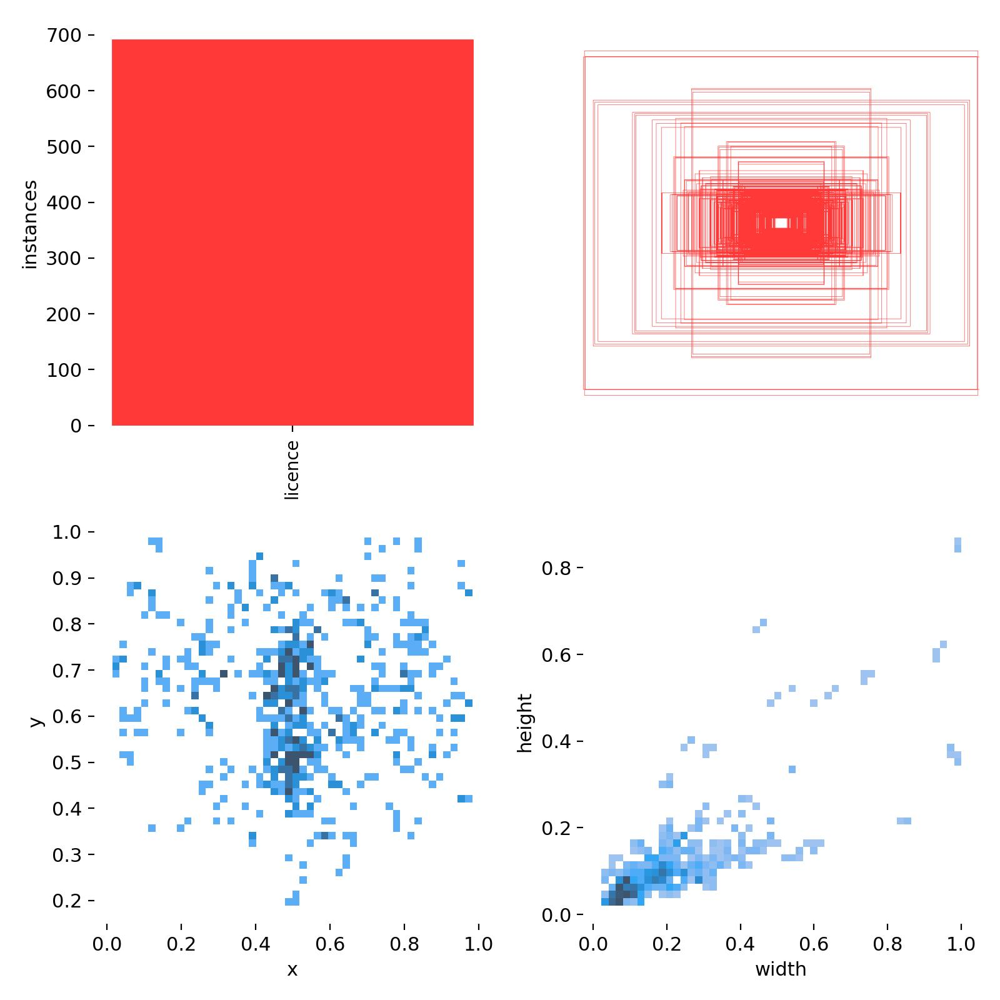

In [ ]:
from IPython.display import Image

Image("/content/yolov10/runs/detect/train2/labels.jpg")

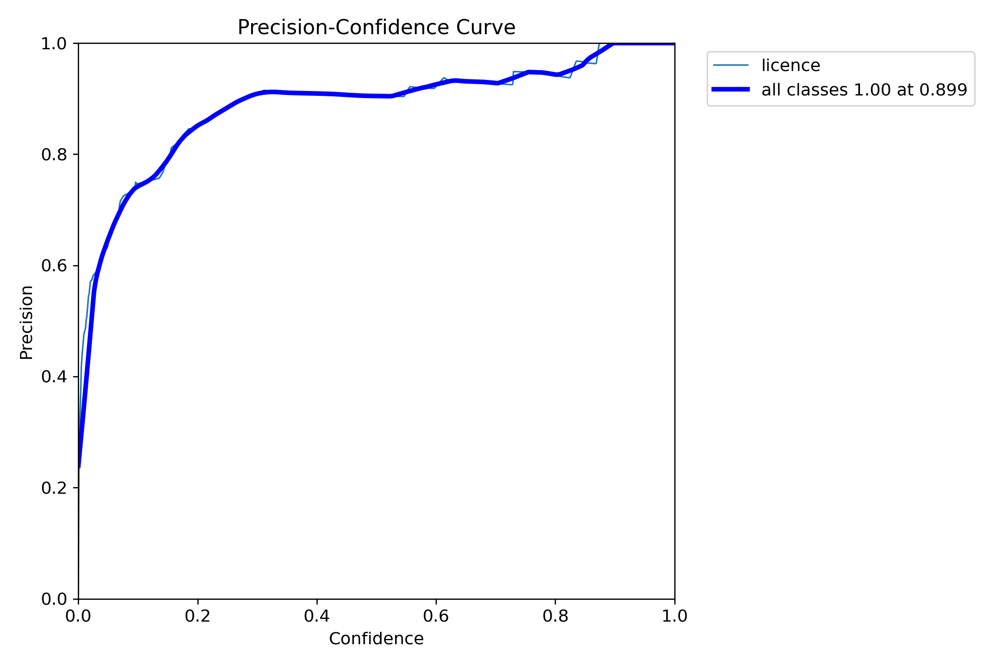

In [ ]:
Image("/content/yolov10/runs/detect/train2/P_curve.png")

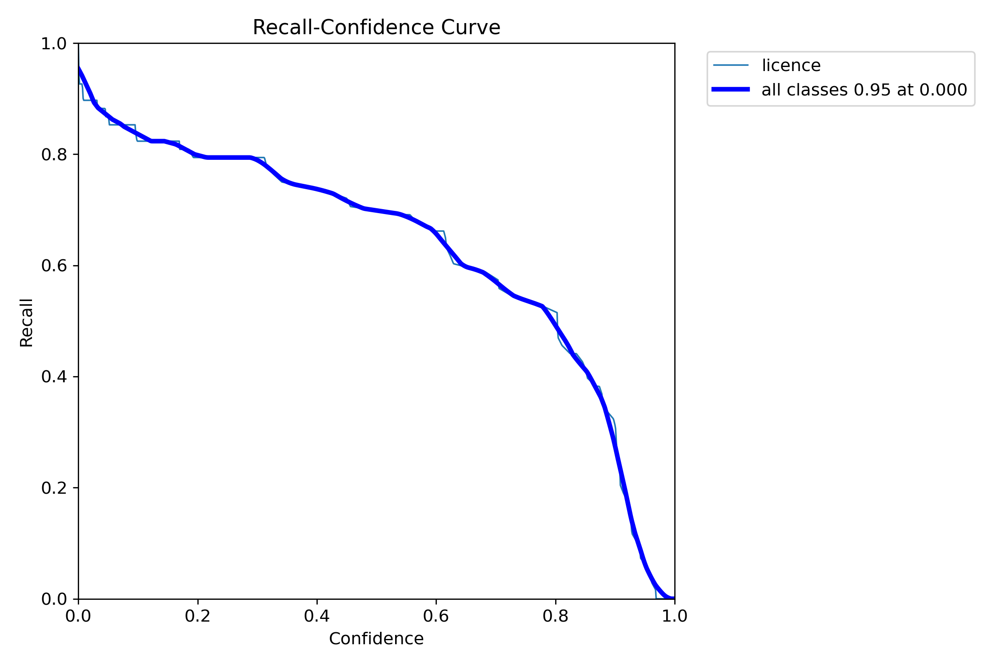

In [ ]:
Image("/content/yolov10/runs/detect/train2/R_curve.png")

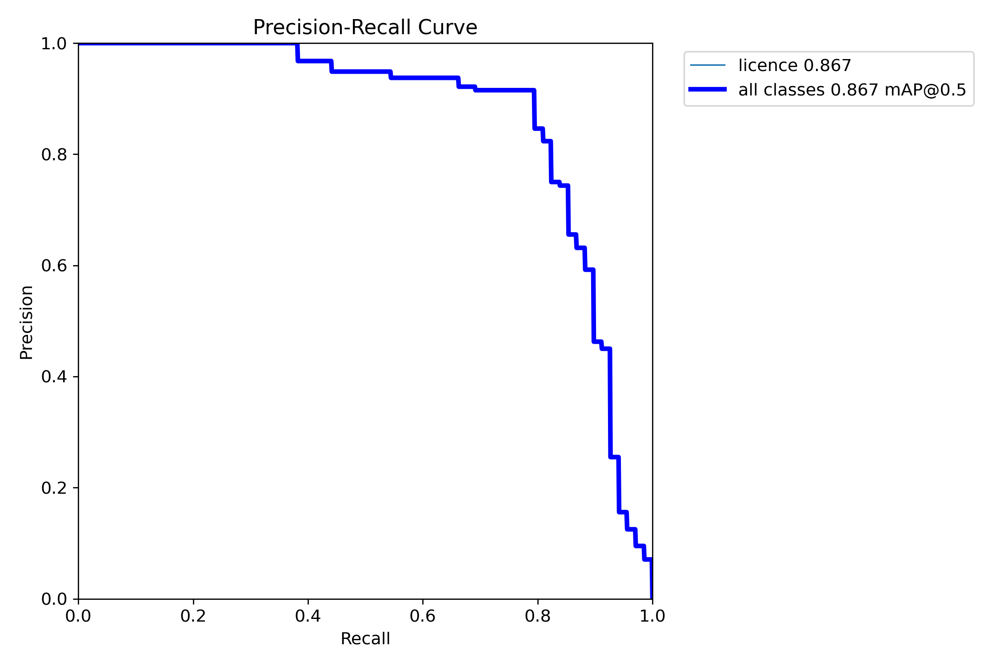

In [ ]:
Image("/content/yolov10/runs/detect/train2/PR_curve.png")

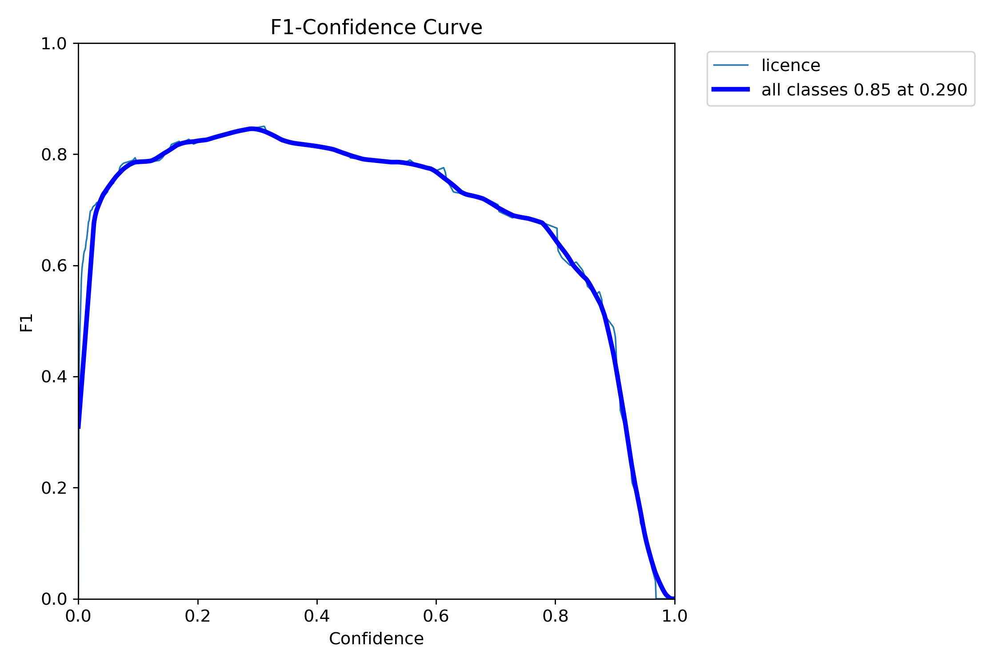

In [ ]:
Image("/content/yolov10/runs/detect/train2/F1_curve.png")

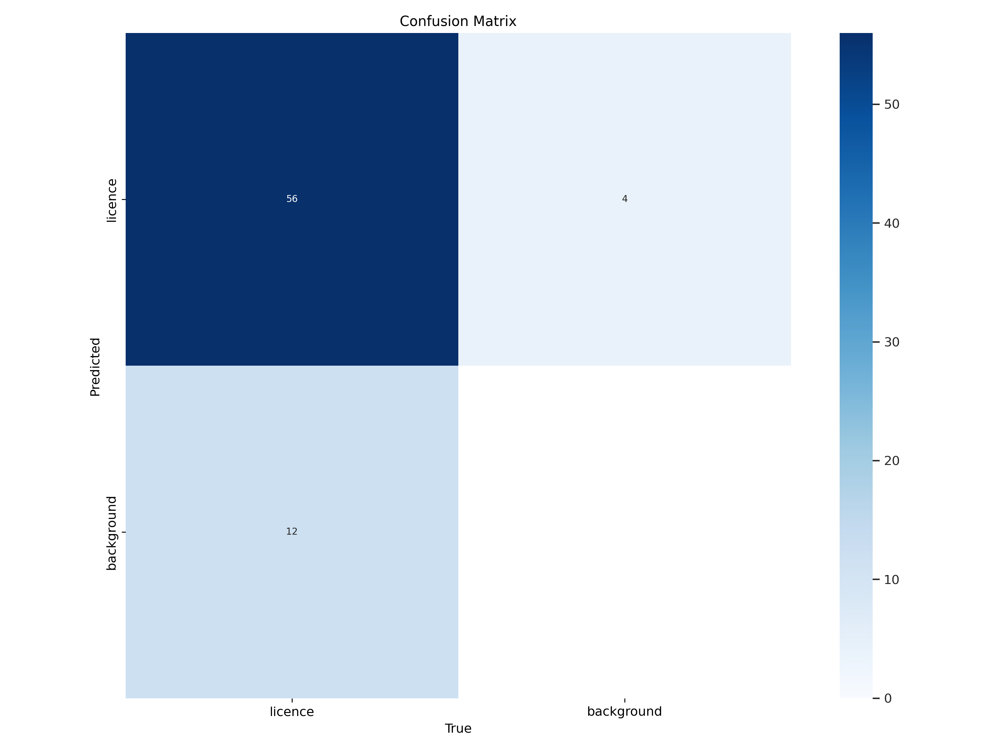

In [ ]:
Image("/content/yolov10/runs/detect/train2/confusion_matrix.png")

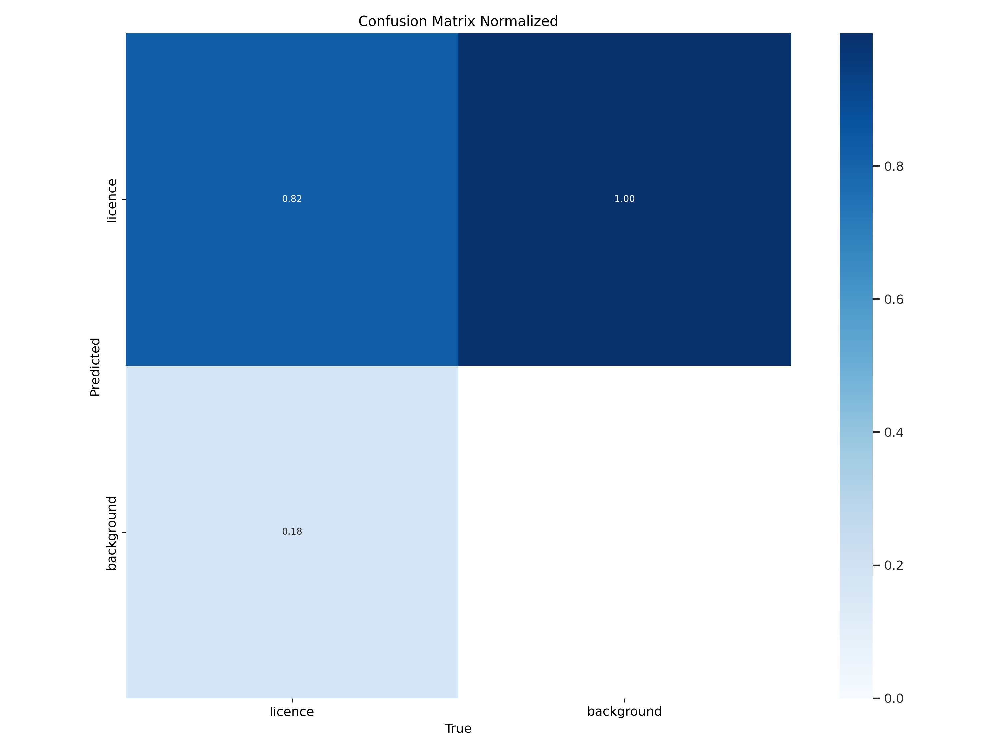

In [ ]:
Image("/content/yolov10/runs/detect/train2/confusion_matrix_normalized.png")

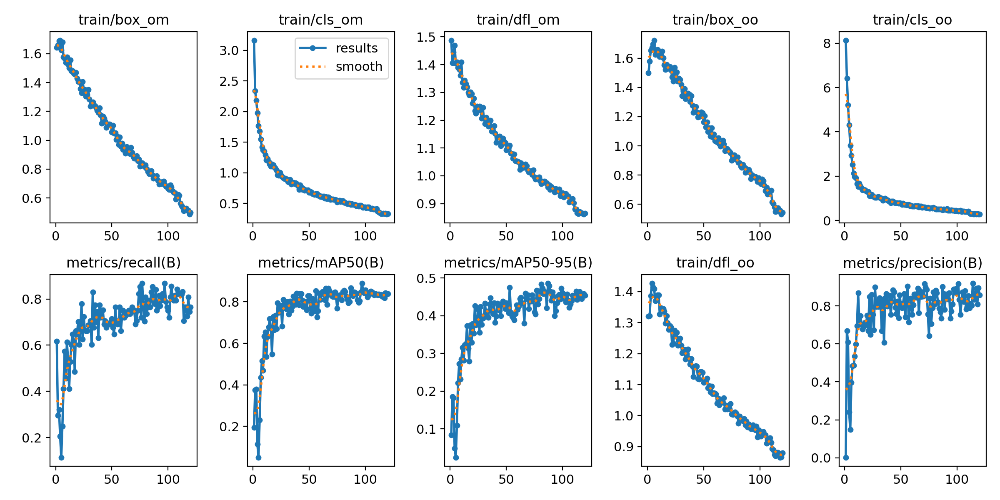

In [ ]:
Image("/content/yolov10/runs/detect/train2/results.png")

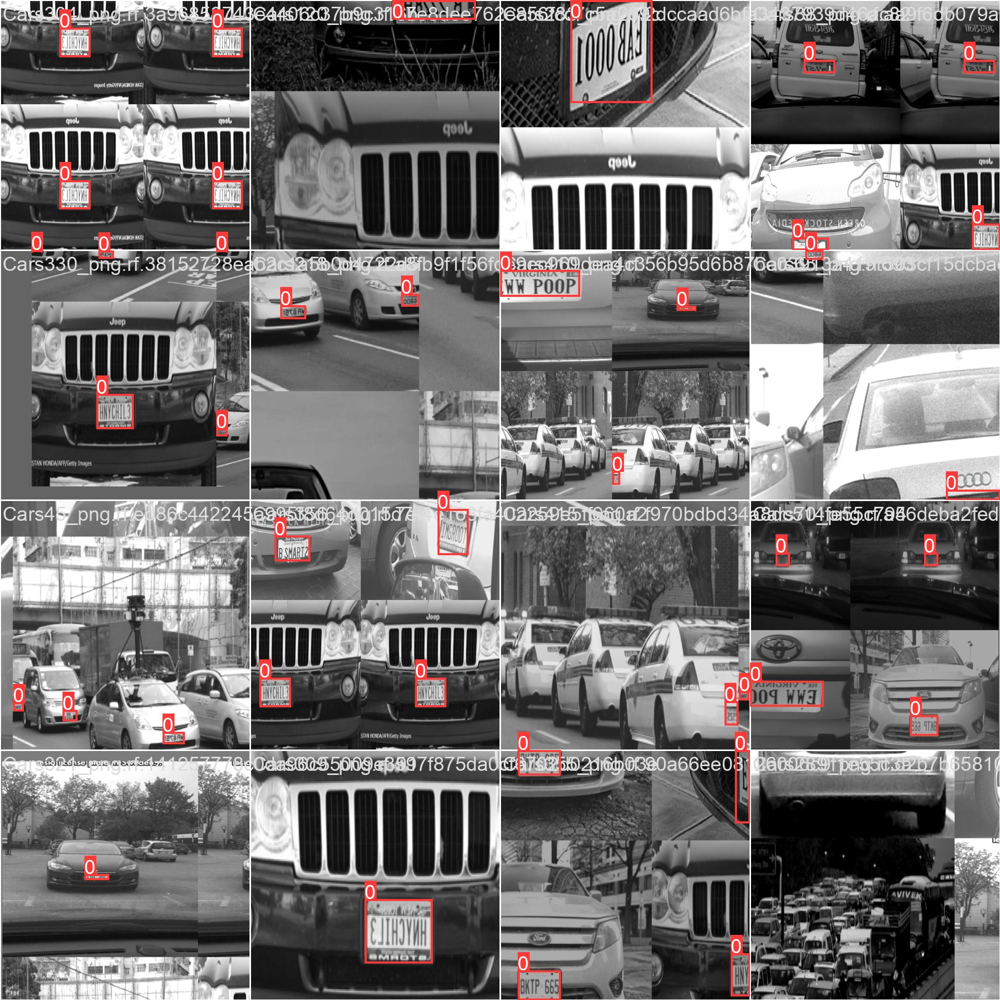

In [ ]:
Image("/content/yolov10/runs/detect/train2/train_batch0.jpg")

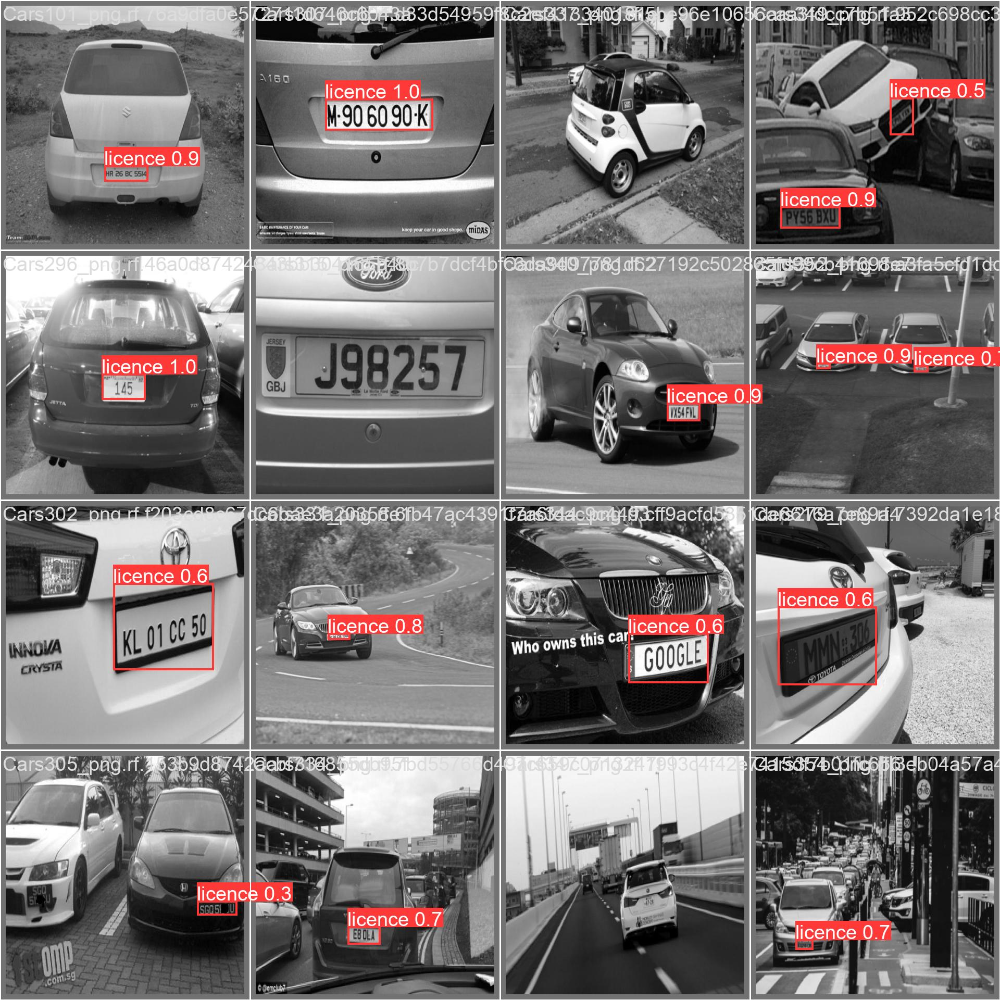

In [ ]:
Image("/content/yolov10/runs/detect/train2/val_batch0_pred.jpg")

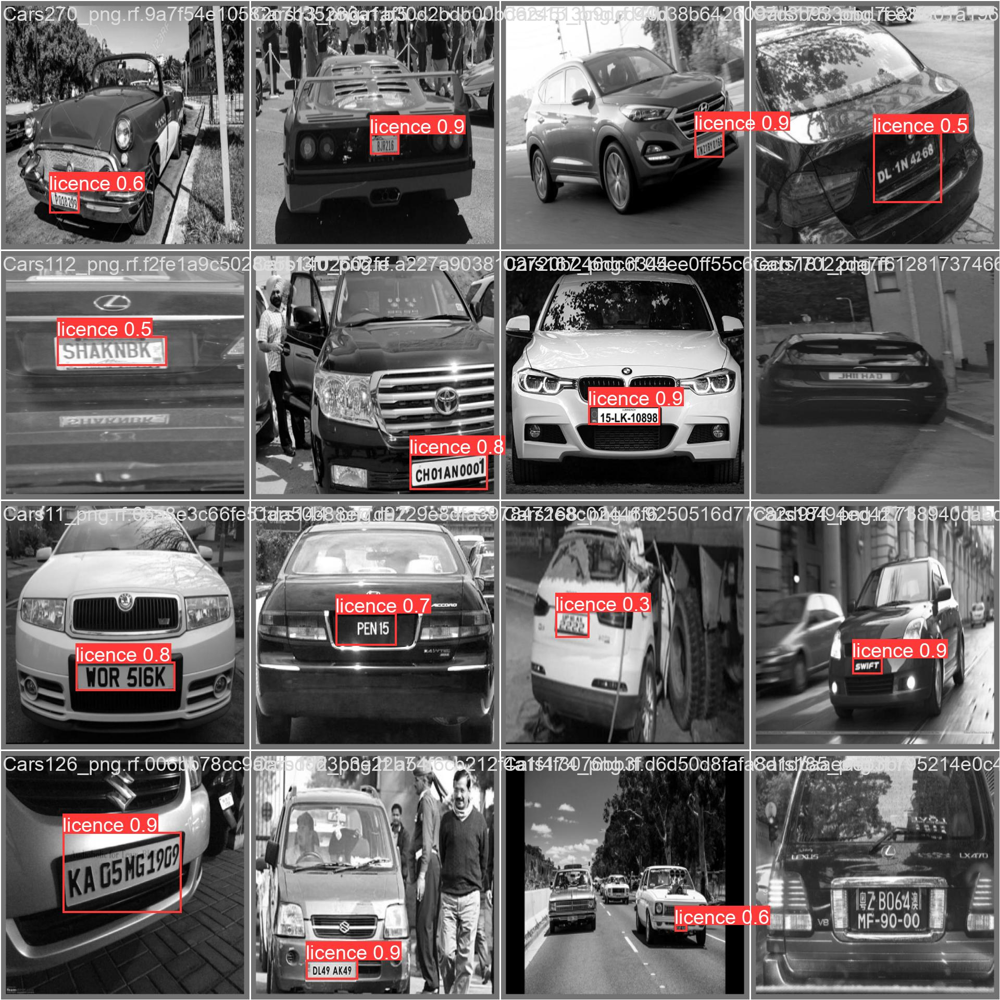

In [ ]:
Image("/content/yolov10/runs/detect/train2/val_batch1_pred.jpg")

#**Step 07: Download the Model Weights from Drive**

In [ ]:
!gdown "https://drive.google.com/uc?id=132Wdk5jptRfgNoav8vePYk9chBwiDHDc&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=132Wdk5jptRfgNoav8vePYk9chBwiDHDc&confirm=t
To: /content/yolov10/best.pt
100% 5.77M/5.77M [00:00<00:00, 23.8MB/s]


#**Step 08: Inference on Image**

In [ ]:
!gdown "https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=15wQmUQu4YnsinJswkDe7zr1QU5Ulue9O&confirm=t
To: /content/yolov10/carImage1.png
100% 358k/358k [00:00<00:00, 125MB/s]


In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='carImage1.png'

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/yolov10/carImage1.png: 384x640 1 licence, 186.0ms
Speed: 4.1ms preprocess, 186.0ms inference, 211.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/yolov10/runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


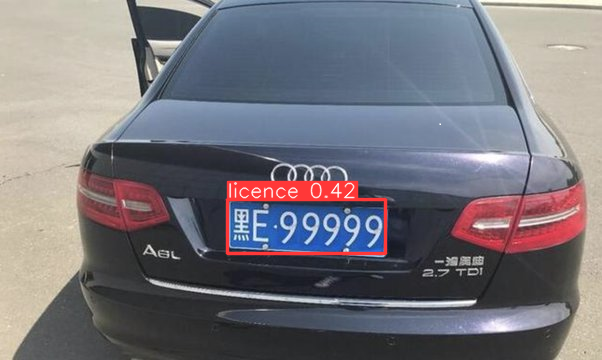

In [ ]:
from IPython.display import Image
Image(filename='runs/detect/predict2/carImage1.png')


In [ ]:
!gdown "https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=12X-xluoK8zK36F6mudICff2ZjgpQ6Qal&confirm=t
To: /content/yolov10/carImage2.png
100% 139k/139k [00:00<00:00, 85.3MB/s]


In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='carImage2.png'

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

image 1/1 /content/yolov10/carImage2.png: 416x640 1 licence, 202.5ms
Speed: 3.7ms preprocess, 202.5ms inference, 203.1ms postprocess per image at shape (1, 3, 416, 640)
Results saved to /content/yolov10/runs/detect/predict4
💡 Learn more at https://docs.ultralytics.com/modes/predict


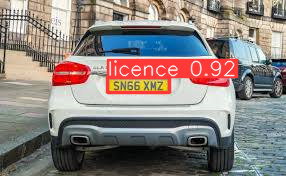

In [ ]:
from IPython.display import Image
Image(filename='runs/detect/predict4/carImage2.png')


#**Step 09: Download the Demo Videos**

In [ ]:
!gdown "https://drive.google.com/uc?id=11Cd4ScvMj3yAvYDrQBERj7Oz7oVGmMka&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=11Cd4ScvMj3yAvYDrQBERj7Oz7oVGmMka&confirm=t
To: /content/yolov10/1.mp4
100% 2.38M/2.38M [00:00<00:00, 145MB/s]


In [ ]:
!gdown "https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=14CTYNzHsQJdnRbKdvB3bA_7CTzUrHHm9&confirm=t
To: /content/yolov10/demo.mp4
100% 9.56M/9.56M [00:00<00:00, 31.9MB/s]


#**Step 10: Inference on Video**

In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='demo.mp4'

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/631) /content/yolov10/demo.mp4: 416x640 1 licence, 92.1ms
video 1/1 (frame 2/631) /content/yolov10/demo.mp4: 416x640 2 licences, 10.0ms
video 1/1 (frame 3/631) /content/yolov10/demo.mp4: 416x640 3 licences, 10.2ms
video 1/1 (frame 4/631) /content/yolov10/demo.mp4: 416x640 2 licences, 10.6ms
video 1/1 (frame 5/631) /content/yolov10/demo.mp4: 416x640 1 licence, 10.4ms
video 1/1 (frame 6/631) /content/yolov10/demo.mp4: 416x640 1 licence, 11.0ms
video 1/1 (frame 7/631) /content/yolov10/demo.mp4: 416x640 3 licences, 10.5ms
video 1/1 (frame 8/631) /content/yolov10/demo.mp4: 416x640 2 licences, 10.3ms
video 1/1 (frame 9/631) /content/yolov10/demo.mp4: 416x640 2 licences, 14.4ms
video 1/1 (frame 10/631) /content/yolov10/demo.mp4: 416x640 1 licence, 14.1ms
video 1/1 (frame 11/631) /content/yolov10/demo.mp4: 4

#**Display the Output Video**

In [ ]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/predict5/demo.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

In [ ]:
!yolo task=detect mode=predict conf=0.25 save=True model='best.pt' source='1.mp4'

Ultralytics YOLOv8.1.34 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv10n summary (fused): 285 layers, 2694806 parameters, 0 gradients, 8.2 GFLOPs

video 1/1 (frame 1/140) /content/yolov10/1.mp4: 384x640 1 licence, 97.2ms
video 1/1 (frame 2/140) /content/yolov10/1.mp4: 384x640 1 licence, 16.9ms
video 1/1 (frame 3/140) /content/yolov10/1.mp4: 384x640 1 licence, 15.2ms
video 1/1 (frame 4/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.2ms
video 1/1 (frame 5/140) /content/yolov10/1.mp4: 384x640 1 licence, 14.4ms
video 1/1 (frame 6/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.8ms
video 1/1 (frame 7/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.8ms
video 1/1 (frame 8/140) /content/yolov10/1.mp4: 384x640 (no detections), 13.3ms
video 1/1 (frame 9/140) /content/yolov10/1.mp4: 384x640 (no detections), 14.6ms
video 1/1 (frame 10/140) /content/yolov10/1.mp4: 384x640 1 licence, 13.0ms
video 1/1 (frame 11/140) /content/yolov10/1.mp4: 384x640 1 licence, 15.9ms
vi

In [ ]:
!rm '/content/result_compressed.mp4'

In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'runs/detect/predict6/1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)